At 137 MB (If I recall it was 78.6 MB just two years ago), the CSV for this dataset isn't huge. But with a little work, it's been shrunk down by nearly 90%. This notebook shows the steps for how that was done as well as and analysis and display of data. 

## The imports

In [1]:
import pandas as pd

import missingno

import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
from folium.plugins import HeatMap

## Bring in the data

Because this is the all-in-one and I also use this for testing, I have options for:
 * The local parquet - small, fast and the work is already done
 * Kaggle parquet - same but requires a download
 * CSV download from Denver Open Data

In [2]:
# Try to load the Parquet file from local data directory
try:
    df = pd.read_parquet('../data/denver_accidents.parquet')
    print("Parquet file loaded from local data directory.")
except FileNotFoundError:
    # Try to load the CSV file from local data directory
    try:
        df = pd.read_csv('../data/traffic_accidents.csv', low_memory=False)
        print("CSV file loaded from local data directory.")
    except FileNotFoundError:
        print("Local files not found. Trying Kaggle files.")
        # Try to load the Parquet file from Kaggle input directory
        try:
            df = pd.read_parquet('/kaggle/input/denver-traffic-accidents/denver_accidents.parquet')
            print("Parquet file loaded from Kaggle input directory.")
        except FileNotFoundError:
            # Try to load the CSV file from Kaggle 
            try:
                df = pd.read_csv('/kaggle/input/denver-traffic-accidents/denver.csv')
                print("CSV file loaded from Kaggle input directory.")
            except FileNotFoundError:
                print("Files not found in either location.")
                df = pd.DataFrame()  # Fallback to an empty DataFrame
            

CSV file loaded from local data directory.


In [3]:
pd.set_option('future.no_silent_downcasting', True)

In [4]:
df.head(2)

,object_id,incident_id,offense_id,offense_code,offense_code_extension,top_traffic_accident_offense,first_occurrence_date,last_occurrence_date,reported_date,incident_address,...,SERIOUSLY_INJURED,FATALITIES,FATALITY_MODE_1,FATALITY_MODE_2,SERIOUSLY_INJURED_MODE_1,SERIOUSLY_INJURED_MODE_2,POINT_X,POINT_Y,x,y
0,226225270,2023202134,202320213454410,5441,0,TRAF - ACCIDENT,4/19/2023 5:53:00 PM,4/19/2023 10:53:00 AM,4/19/2023 10:53:00 AM,I25 HWYNB / 6TH TO NB I25 RAMP,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.136312e+06,1.691440e+06
1,226225271,2023202140,202320214054410,5441,0,TRAF - ACCIDENT,4/19/2023 6:00:00 PM,4/19/2023 11:00:00 AM,4/19/2023 11:22:00 AM,W 5TH 6TH ALY / N BANNOCK ST,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.143217e+06,1.689224e+06


# Alright, thumbs up? Ready to wrangle some data? 
## Let's do this. *[Leeroy Jenkins](https://youtu.be/mLyOj_QD4a4?t=83)*
<br>

## Column level changes

In [5]:
# Change the case to Title_Snake_Case
df.columns = ['_'.join(word.capitalize() for word in col.split('_')) for col in df.columns]

In [6]:
# Drop useless columns
df.drop(['Object_Id', 'Last_Occurrence_Date', 'Geo_X', 'Geo_Y', 'Point_X', 'Point_Y', 'X', 'Y'], axis=1, inplace=True)

In [7]:
# Cast columns with `Date` in them as datetimes
date_cols = [col for col in df.columns if 'Date' in col]

In [8]:
for col in date_cols:
    df[col] = pd.to_datetime(df[col], format="%m/%d/%Y %I:%M:%S %p")

## Let's get a handle on what we have, what needs to be fixed, and how

#### First, let's save the number of columns for posterity. This number will go down due by making things the same case and lumping in all the entry errors together (e.g NaNs, ' ', and misentries are all failures to enter data correctly). Also, memory will be saved by changing some of the columns to a different datatype. Plus parquet. Man, that's a super effective format. 

In [9]:
for column in df.columns:
    unique_count = df[column].nunique()
    print(f"{column}: number of unique values: {unique_count}")

Incident_Id: number of unique values: 254996
Offense_Id: number of unique values: 254997
Offense_Code: number of unique values: 3
Offense_Code_Extension: number of unique values: 4
Top_Traffic_Accident_Offense: number of unique values: 6
First_Occurrence_Date: number of unique values: 241675
Reported_Date: number of unique values: 247300
Incident_Address: number of unique values: 49453
Geo_Lon: number of unique values: 36470
Geo_Lat: number of unique values: 36442
District_Id: number of unique values: 22
Precinct_Id: number of unique values: 36
Neighborhood_Id: number of unique values: 78
Bicycle_Ind: number of unique values: 4
Pedestrian_Ind: number of unique values: 5
Harmful_Event_Seq_1: number of unique values: 87
Harmful_Event_Seq_2: number of unique values: 85
Harmful_Event_Seq_3: number of unique values: 87
Road_Location: number of unique values: 15
Road_Description: number of unique values: 24
Road_Contour: number of unique values: 32
Road_Condition: number of unique values: 28

## Inspect the data

In [10]:
def all_uniques_in_all_cols(df):
    '''
    use: lists all the unique values for evey column in a dataframe
    input: dataframe
    output: formatted output of all the unique values in the dataframe
    
    '''
    for col in df.columns.to_list():
        print(f"""There are {df[col].nunique()} unique values for {col}:
              {df[col].unique()}
              """)


# all_uniques_in_all_cols(df)

In [11]:
# df.info()

In [12]:
# missingno.bar(df)

Not too bad. Right off the bat, we can see that `Geo_Lon and Geo_Lat` have a few missing entries. You simply can't plot points without a location so we need to just drop those rows.

The other ones are not quite so clear-cut. Most of the information can be used as what isn't included may not be needed anyway so it wouldn't make sense to drop it. But -- and you only get this from looking at the entries -- some of this isn't included due to an ongoing investigation and/or a court case. Still, others are due to a failure to enter what is presumably important data because most have it filled in. Identifying that could be of use.

One thing to consider is if that's because the fields were added. So, we can drop the columns, drop the rows, relabel the rows -- or do a little analysis to explore and make a better decision.

Let's start with dropping those rows.

In [13]:
df.dropna(subset=['Geo_Lon', 'Geo_Lat'], axis=0, inplace=True)

## Work to do:

 - [X] Drop useless columns, Title_Snake_Case the rest, and make Date columns datetime format, drop rows with missing GeoCords (done above)
 
 - [X] `Top_Traffic_Accident_Offense` remove prepending `TRAF - ACCIDENT - `; rstrip whitespace

 - [X]  For the fields that are numbers, convert NaNs and spaces to -1 

 - [X]  For the fields that are not text, convert NaNs and spacesto 'Data not entered' 

   - [x] Convert column content text to Title Case
   - [x] Additional work as below

<br>

- [x] Secondary fixes:
   - [x] 'Tu1_Vehicle_Type': '0'
   - [x] 'Tu1_Travel_Direction': ['021', '91']
   - [x] 'Tu1_Vehicle_Movement': ['  ', '18', '021', '00'] # leaving unk as a valid answer
   - [x] 'Tu1_Diver_Action': [' ', '17', na, ]
   - [x] 'Tu1_Driver_Humancontribfactor': [' ',' 00', ' 06', '17', '18']
   - [x] 'Tu1_Pedestrian_Action': ['00', '/', '--', '-']
   - [x] 'Tu2_Vehicle_Type' [' '] 
   - [x] 'Tu1_Travel_Direction': ['  ', '01', '05', '03', '07', '02', '00']
   - [x] ['Seriously_Injured_Mode_1', 'Seriously_Injured_Mode_2'] :  ' '
   - [x] Light_Condition: Day Light = daylight
   - [x] strip space from District_Id 

##### Considering these are all getting labeled as `Data Misentered` these can all get lumped together

In [14]:
df['Top_Traffic_Accident_Offense'] = df['Top_Traffic_Accident_Offense'].str.rstrip().replace('TRAF - ', '')

### For this next part I don't want to have to redo it

In [15]:
number_cols = df.select_dtypes(include=['int', 'float']).columns.tolist()

In [16]:
text_cols = df.select_dtypes(include='object').columns.tolist()


In [17]:
values_to_replace = ['0', '00', ' 00', '  00', '01', '02', '03', '05', ' 06', '07', 
                    '17', '18', '021', '91', '00', ' 00', 'Na', 'na', '/', ' ', '--', '-']

In [18]:
def fix_missing(df, number_cols, text_cols, num_na_value=-1, text_na_value='Data Misentered', text_replace_values=None):
    # Handling numerical columns
    for col in number_cols:
        if df[col].dtype in ['float64', 'int64']:  # Ensure it's a numerical column
            df[col] = df[col].fillna(num_na_value)  # Replace NaN with -1

    # Handling text/object columns
    for col in text_cols:
        if df[col].dtype == 'object':  # Ensure it's a text column
            df[col] = df[col].fillna(text_na_value)  # Replace NaN with 'Data Misentered'
            
            # Replace values consisting of one or more spaces with 'Data Misentered'
            df[col] = df[col].replace(r'^\s*$', text_na_value, regex=True)
            
            # Replace specific values if text_replace_values is provided
            if text_replace_values:
                df[col] = df[col].replace(text_replace_values, text_na_value)
    
    return df

In [19]:
df = fix_missing(df, number_cols, text_cols, num_na_value=-1, text_na_value='Data Misentered', text_replace_values=values_to_replace)
df

,Incident_Id,Offense_Id,Offense_Code,Offense_Code_Extension,Top_Traffic_Accident_Offense,First_Occurrence_Date,Reported_Date,Incident_Address,Geo_Lon,Geo_Lat,...,Tu2_Vehicle_Movement,Tu2_Driver_Action,Tu2_Driver_Humancontribfactor,Tu2_Pedestrian_Action,Seriously_Injured,Fatalities,Fatality_Mode_1,Fatality_Mode_2,Seriously_Injured_Mode_1,Seriously_Injured_Mode_2
0,2023202134,202320213454410,5441,0,TRAF - ACCIDENT,2023-04-19 17:53:00,2023-04-19 10:53:00,I25 HWYNB / 6TH TO NB I25 RAMP,-105.015348,39.730808,...,Going Straight,No Contributing Action,No Apparent Contributing Factor,Data Misentered,0.0,0.0,Data Misentered,Data Misentered,Data Misentered,Data Misentered
1,2023202140,202320214054410,5441,0,TRAF - ACCIDENT,2023-04-19 18:00:00,2023-04-19 11:22:00,W 5TH 6TH ALY / N BANNOCK ST,-104.990843,39.724621,...,Stopped in Traffic,No Contributing Action,No Apparent Contributing Factor,Data Misentered,0.0,0.0,Data Misentered,Data Misentered,Data Misentered,Data Misentered
2,2023165493,202316549354010,5401,0,TRAF - ACCIDENT - HIT & RUN,2023-03-31 16:45:00,2023-03-31 09:45:00,800 BLOCK N OGDEN ST,-104.974994,39.729334,...,Going Straight,No Contributing Action,No Apparent Contributing Factor,Data Misentered,0.0,0.0,Data Misentered,Data Misentered,Data Misentered,Data Misentered
3,2023166295,202316629554410,5441,0,TRAF - ACCIDENT,2023-03-31 23:54:00,2023-03-31 16:54:00,I70 HWYWB / N SHERIDAN BLVD,-105.053244,39.783675,...,Slowing,No Contributing Action,No Apparent Contributing Factor,Data Misentered,0.0,0.0,Data Misentered,Data Misentered,Data Misentered,Data Misentered
4,2023166532,202316653254010,5401,0,TRAF - ACCIDENT - HIT & RUN,2023-04-01 02:25:00,2023-04-03 21:03:00,14TH ST/ ARAPAHOE ST,-104.998049,39.745988,...,Data Misentered,No Contributing Action,No Apparent Contributing Factor,Data Misentered,0.0,0.0,Data Misentered,Data Misentered,Data Misentered,Data Misentered
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255000,2022545985,202254598554410,5441,0,TRAF - ACCIDENT,2022-10-22 03:30:00,2022-10-21 21:25:00,3700 BLOCK N SHERIDAN BLVD,-105.052905,39.767672,...,OTHER,OTHER,OTHER,OTHER,0.0,0.0,OTHER,OTHER,OTHER,OTHER
255001,2022545165,202254516554410,5441,0,TRAF - ACCIDENT,2022-10-21 19:34:00,2022-10-21 12:34:00,I25 HWYNB / PARK AVEW,-104.994971,39.768017,...,OTHER,OTHER,OTHER,OTHER,0.0,0.0,OTHER,OTHER,OTHER,OTHER
255002,2022545293,202254529354410,5441,0,TRAF - ACCIDENT,2022-10-21 20:35:00,2022-10-21 13:38:00,N PEORIA ST / I70 HWYEB,-104.847037,39.774007,...,OTHER,OTHER,OTHER,OTHER,0.0,0.0,OTHER,OTHER,OTHER,OTHER
255003,2022590222,202259022254410,5441,0,TRAF - ACCIDENT,2022-11-15 19:30:00,2022-11-15 13:26:00,E 13TH AVE / N EMERSON ST,-104.976452,39.736868,...,OTHER,OTHER,OTHER,OTHER,0.0,0.0,OTHER,OTHER,OTHER,OTHER


In [20]:
#all_uniques_in_all_cols(df)

### Let's see if we got all the missing values

<Axes: >

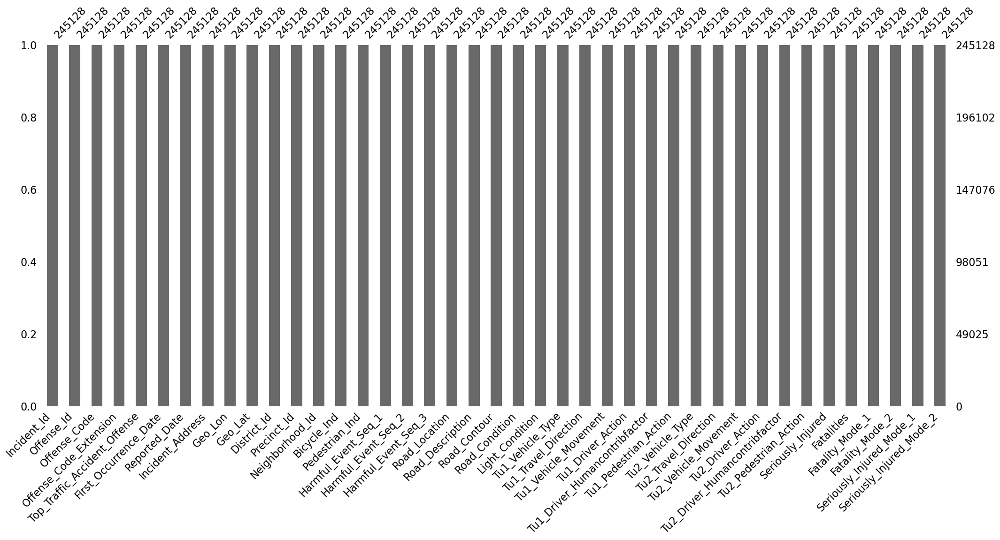

In [21]:
missingno.bar(df)

### OK, all that filled in is so much better. Let's improve the quality of the dataset by removing misentries

## Last items
Scanning though the results of `all_uniques_in_all_cols` I see the columns still need to be switched to Title Case and District_ID ste

In [22]:
title_case = [col for col in text_cols if 'Id' not in col]

In [23]:
def column_contents_to_title_case(df, columns):
    # Ensure the columns list only includes those that exist in the DataFrame
    columns = [col for col in columns if col in df.columns]

    # Apply the transformation to convert the specified columns to title case
    df[columns] = df[columns].apply(lambda col: col.astype(str).str.title())

    return df

In [24]:
df = column_contents_to_title_case(df, columns=title_case)

In [25]:
df['District_Id'] =  df['District_Id'].str.strip()

In [26]:
df['Top_Traffic_Accident_Offense'] =  df['Top_Traffic_Accident_Offense'].str.strip()

In [27]:
df['Light_Condition'] = df['Light_Condition'].str.replace('Day Light', 'Daylight', regex=False)

In [28]:
df['Top_Traffic_Accident_Offense'] = df['Top_Traffic_Accident_Offense'].str.replace('Traf - ', '', regex=False)

In [29]:
#all_uniques_in_all_cols(df)

In [30]:
#df.info()

## Save memory by changing data types.
When started we were at 78.5 mb. That's still true. While that's quite manageable, let's get that down anyway.
`text_cols` are all objects, so no issues there. Except for `Incident_Address`


The numerics are different though. They break like this
Int64: Offense_Id
Int32:  Incident_Id, Geo_Lon, Geo_Lat
category: Offense_Code, Offense_Code_Extension, District_Id, Precinct_Id, Bicycle_Ind, Pedestrian_Ind, Seriously_Injured, Fatalities

In [31]:
updated_text_cols=[col for col in text_cols if col != text_cols[1]]
additional_cols = ['Offense_Code', 'Offense_Code_Extension', 'Precinct_Id', 'Bicycle_Ind', 'Pedestrian_Ind', 'Seriously_Injured', 'Fatalities']

In [32]:
# from 78mb to 38 mb memory usage 

to_catagorical = updated_text_cols + additional_cols
df[to_catagorical] = df[to_catagorical].astype('category')

In [33]:
df = df.astype({'Incident_Id': 'float32', 'Geo_Lon': 'float32', 'Geo_Lat': 'float32'})

In [34]:
#df.info()

In [35]:
df.to_parquet("../data/traffic_accidents.parquet")

## Memory use, for reference:

The CSV downloaded is 137.3 mb
Oddly is uses originally used 78.5 mb memory. 
After a bit of work, we have the following
 - 23.5 mb converting to category.
 - 20.1 making the  `Geo_Lat, Geo_Lon and Incident_Id` all float 32.

That's really about the smallest we can get it as a csv and dataframe. Now, saving this to parquet makes the file 14.1 mb download.

----

# Part 2: EDA

---
Here are the questions I have so far:
  1. Where are the accidents in general?
  2. Of those locations, where are you most likely to get killed?
  3. Time Analysis
  4. Accidents by Cause
 

## 1. Where are the accidents in general?

In [36]:
lat = df.Geo_Lat.mean()
lon =  df.Geo_Lon.mean()

In [37]:
denver_map = folium.Map(location=[lat, lon], tiles="Cartodb Positron", zoom_start=11)

heat_map = folium.FeatureGroup(name = 'heat_map')
heat_map.add_child( HeatMap( list(zip(df['Geo_Lat'].values, df['Geo_Lon'].values)), 
                   min_opacity=0.3,
                   radius=8.5, blur=6, 
                   max_zoom=1, 
                 ))

denver_map.add_child(heat_map)
denver_map

### Visually, it looks like the most accidents occur on the highways. Let's confirm and get details.

## 2. Of those locations, where are you most likely to get killed?

#### I don't know about you but I don't want to die. I have too much to live for. We live in the golden age of television. I have to catch up on Bass Masters.

In [38]:
accident_prone = df.groupby(['Incident_Address', 'Geo_Lon', 'Geo_Lat']).size().reset_index(name='count').sort_values('count', ascending=False)

In [39]:
# Ensure Fatalities column is numeric
df['Fatalities'] = pd.to_numeric(df['Fatalities'], errors='coerce')

# Create the accident_and_death_prone DataFrame with the sum of Fatalities and count of Incidents
accident_and_death_prone = df.groupby(['Incident_Address', 'Geo_Lon', 'Geo_Lat']) \
                             .agg(Total_Fatalities=('Fatalities', 'sum'),
                                  Total_Accidents=('Incident_Address', 'size')) \
                             .sort_values('Total_Accidents', ascending=False) \
                             .reset_index()

# Display the result
accident_and_death_prone.head()



,Incident_Address,Geo_Lon,Geo_Lat,Total_Fatalities,Total_Accidents
0,I25 Hwynb / W 6Th Ave,-105.013229,39.725677,-4.0,1517
1,I70 Hwyeb / N Peoria St,-104.847038,39.774006,-2.0,1021
2,I25 Hwynb / W Alameda Ave,-104.998901,39.711205,-1.0,923
3,I25 Hwysb / 20Th St,-105.004768,39.761158,0.0,812
4,I25 Hwynb / 20Th St,-105.004333,39.760948,1.0,789


In [40]:
# Create a dataframe with the sum of Fatalities
fatalities_sum = df.groupby(['Incident_Address', 'Geo_Lon', 'Geo_Lat']).agg({'Fatalities': 'sum'})\
    .rename(columns={'Fatalities': 'Total_Fatalities'})

# Create a dataframe with the count of Incident_Address
address_count = df['Incident_Address'].value_counts().reset_index()
address_count.columns = ['Incident_Address', 'Total_Accidents']

# Merge the two dataframes on Incident_Address
accident_and_death_prone = fatalities_sum.reset_index().merge(address_count, on='Incident_Address')

# Sort the dataframe by Total_Accidents in descending order
accident_and_death_prone = accident_and_death_prone.sort_values('Total_Accidents', ascending=False)


In [41]:
# add 0.1 to the 'Total_Fatalities' column
accident_and_death_prone['P&C loss index'] = (accident_and_death_prone['Total_Fatalities']+.1)*accident_and_death_prone['Total_Accidents']

# reorder the dataframe by the product of 'Total_Fatalities' and 'Total_Accidents'
accident_and_death_prone = accident_and_death_prone.sort_values('P&C loss index', ascending=False)
accident_and_death_prone.head(25)

,Incident_Address,Geo_Lon,Geo_Lat,Total_Fatalities,Total_Accidents,P&C loss index
36279,I70 Hwyeb / N Havana St,-104.865891,39.775635,2.0,951,1997.1
35913,I25 Hwynb / W 6Th Ave,-105.013130,39.725536,1.0,1733,1906.3
36294,I70 Hwyeb / N Pecos St,-105.006424,39.783138,3.0,521,1615.1
35929,I25 Hwynb / W Colfax Ave,-105.013969,39.740437,2.0,635,1333.5
45268,W 6Th Ave / I25 Hwynb,-105.013130,39.725536,4.0,325,1332.5
35920,I25 Hwynb / W 8Th Ave,-105.014839,39.729321,2.0,418,877.8
35791,I25 Hwynb / 20Th St,-105.004333,39.760948,1.0,789,867.9
36248,I70 Hwyeb / I25 Hwysb,-104.989555,39.780109,2.0,375,787.5
45855,W Colfax Ave / I25 Hwynb,-105.013969,39.740437,3.0,236,731.6
36090,I25 Hwysb / W 8Th Ave,-105.015053,39.729321,2.0,330,693.0


In [42]:
count = round(100/len(set(df['Incident_Address'])), 4)
percent = round(accident_and_death_prone['Total_Accidents'].head(25).sum()*100/accident_and_death_prone['Total_Accidents'].sum(), 4)

print(f"The 25 locations where one is most likely to get into an accident account for {count} percent of the locations but {percent} percent to the accidents.")

The 25 locations where one is most likely to get into an accident account for 0.0023 percent of the locations but 3.7128 percent to the accidents.


In [43]:
accident_and_death_prone['Total_Accidents'].head(25).sum()/accident_and_death_prone['Total_Accidents'].sum()

np.float64(0.037128076405044695)

### The top 25 locations (or about .05% of the locations) make up about 4.5% of the accidents. But, realistically, it's less than that due to the way data was entered. 

 - 20Th St / I25 Hwynb vs I25 Hwysb / 20Th St
 - W 6Th Ave / I25 Hwynb vs I25 Hwynb / W 6Th Ave
 - I25 Hwynb / W 8Th Ave vs I25 Hwysb / W 8Th Ave
 - I70 Hwyeb / N Havana St vs I70 Hwyeb / N Havana St
 - I25 Hwynb / I70 Hwyeb vs 70 Hwyeb / I25 Hwysb

#### While I'm not going to address this (this is, afterall, just preliminary EDA model to entice *you* to use the dataset) we could deconflict this with `Geo_Lat` and `Geo_Lon` location columns.

## 3. Time Analysis

#### or "Damn! Covid had an impact! I wish we'd have another world wide pandemic" 

In [44]:
def lineplots (df, key='First_Occurrence_Date', freq='M',
               xtitle="Denver Accidents by Month", ytitle='# of Collisions'):
    
    fig, ax = plt.subplots(1,1)
    
    plt.style.use('fivethirtyeight')
    fig.set_size_inches(10, 4)

    ax.plot(df.groupby(pd.Grouper(key=key, freq=freq))
        .size(), '.', linestyle=(0, (1, 1)), color = 'blue', linewidth=1)

    ax.set_title(xtitle)
    ax.set_ylabel(ytitle)
    return ax

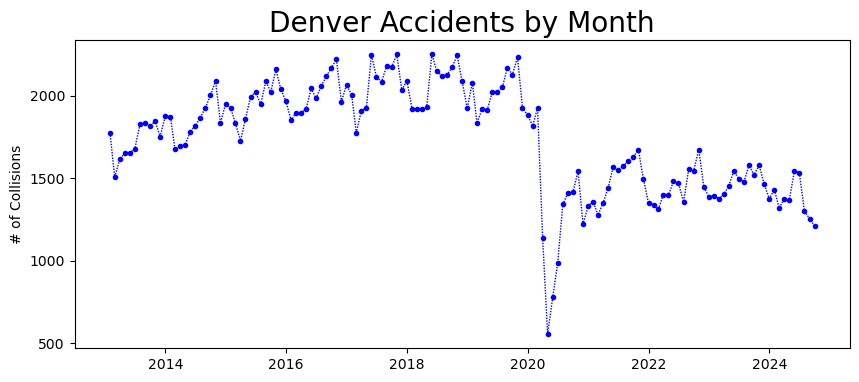

In [45]:
lineplots(df, key='First_Occurrence_Date', freq='ME',
          xtitle="Denver Accidents by Month", ytitle='# of Collisions');

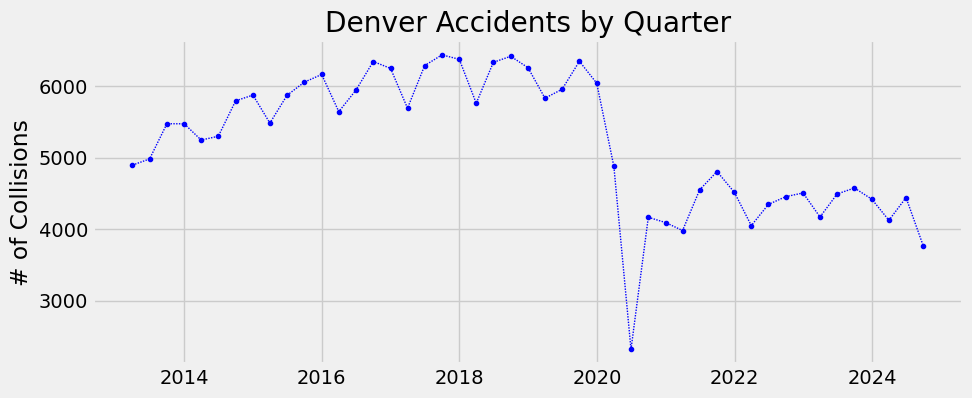

In [46]:
lineplots(df, key='First_Occurrence_Date', freq='QE',
          xtitle="Denver Accidents by Quarter", ytitle='# of Collisions');

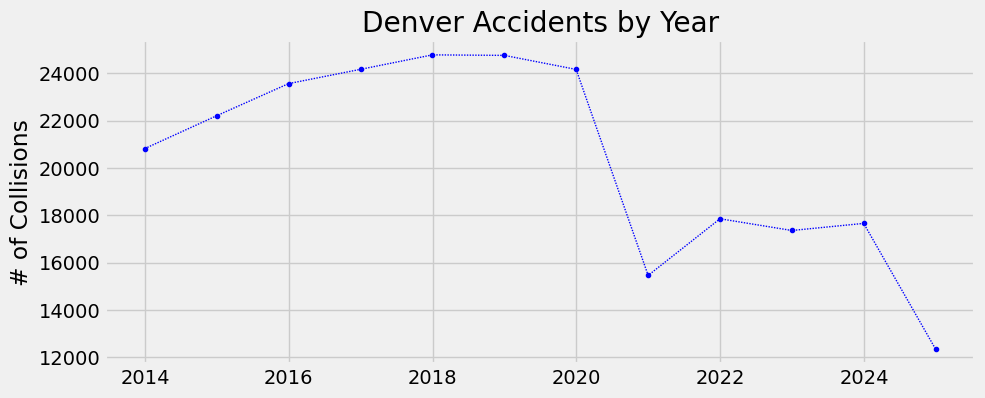

In [47]:
lineplots(df, key='First_Occurrence_Date', freq='YE',
          xtitle="Denver Accidents by Year", ytitle='# of Collisions');

## 4. Accidents by Cause

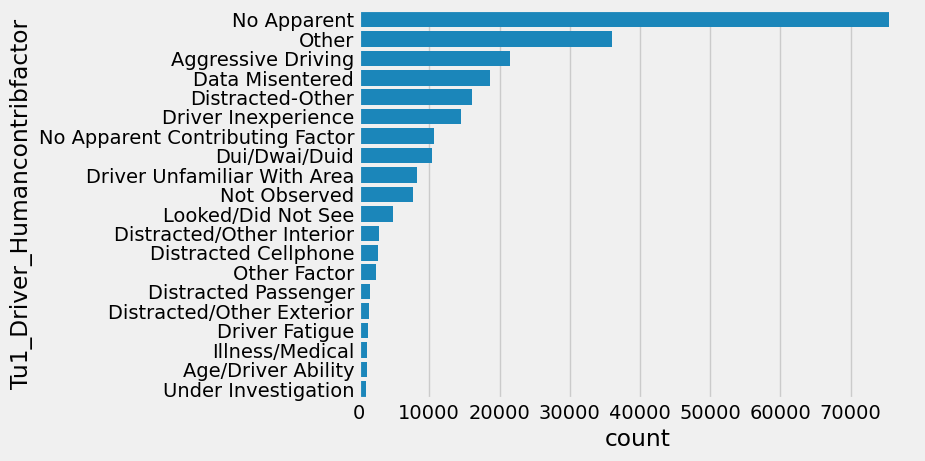

In [48]:
order = df["Tu1_Driver_Humancontribfactor"].value_counts().index.tolist()
sns.countplot(y=df["Tu1_Driver_Humancontribfactor"], order=order[:20]);

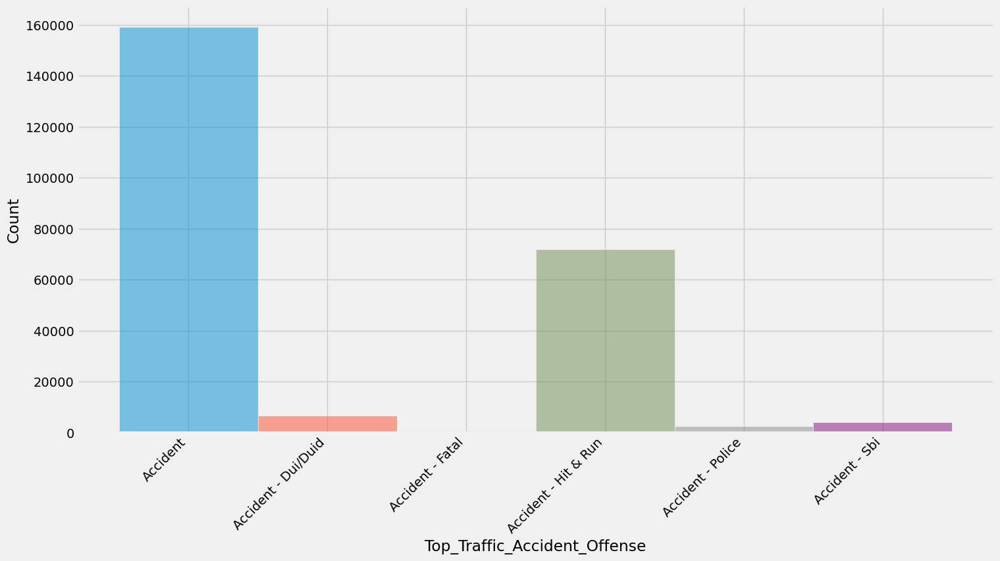

In [49]:
chart = plt.figure(figsize=(16,8))
sns.histplot(df, x="Top_Traffic_Accident_Offense", hue="Top_Traffic_Accident_Offense", legend=False)
plt.xticks(rotation=45, ha='right');

## Cited Cause Analysis over the time of day

### Here is what I think are the take home messages:
 - `DUI/DWAI/DUID` have to big bumps the first is early morning and peaks around 2am it then pick up after 4pm and peaks again between 8 and 10 pm.
 
 - `Driver Fatigue` is very evenly spread
 
 - Similarly, `Asleep At The Wheel` is more of an early morning thing
 
 - You're more likely to end up in an accident with a person who has a physical diasbility in the middle of the day.


/var/folders/_3/9_qsgmm55yg0k3k8tgh0gy3w0000gn/T/ipykernel_48844/2198169659.py:10: UserWarning: 
The palette list has fewer values (8) than needed (36) and will cycle, which may produce an uninterpretable plot.
  ax = sns.violinplot(data=df, x='Hour', y="Tu1_Driver_Humancontribfactor", hue="Tu1_Driver_Humancontribfactor", order=relevant_order, palette=custom_palette, legend=False)


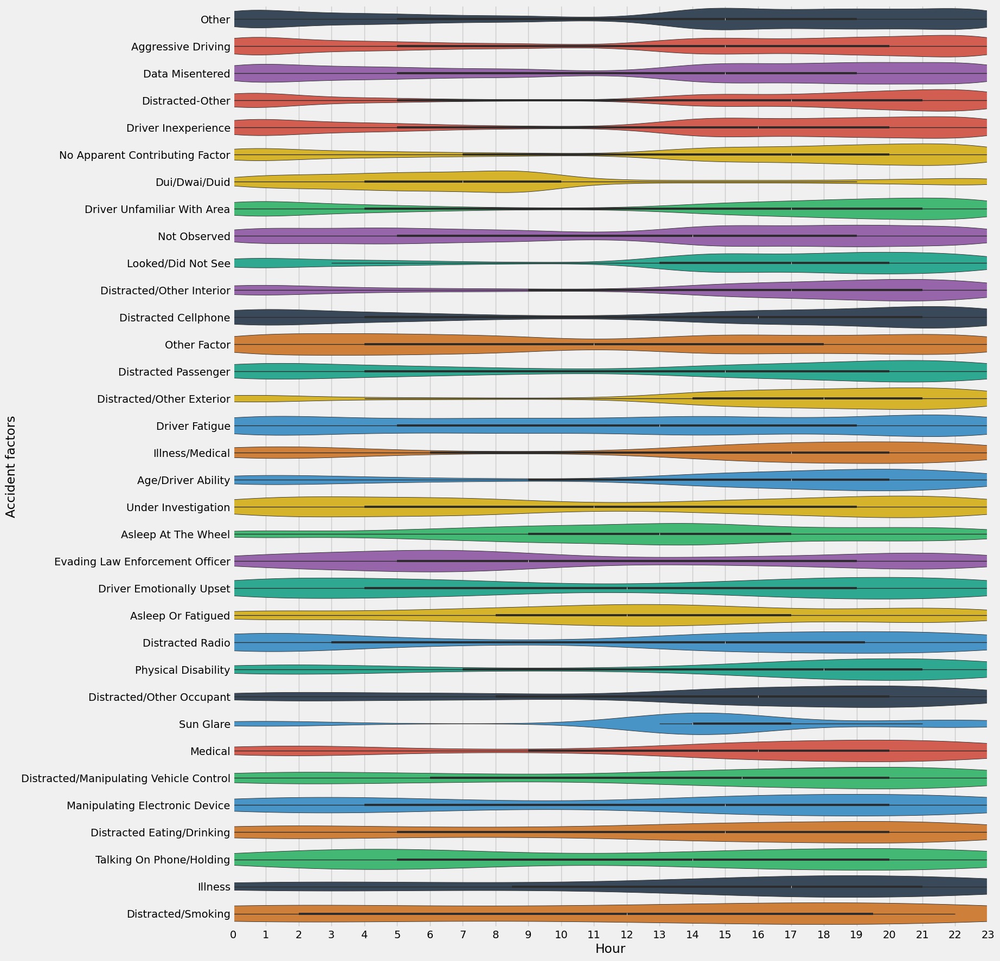

In [50]:

# Extract the hour and create a new column
df['Hour'] = df['First_Occurrence_Date'].dt.hour

custom_palette = ["#3498db", "#e74c3c", "#2ecc71", "#f1c40f", "#9b59b6", "#34495e", "#e67e22", "#1abc9c"]
order = df["Tu1_Driver_Humancontribfactor"].value_counts().index.tolist()
relevant_order = order[1:-1]
chart = plt.figure(figsize=(16,21))

# Assigning the y variable to hue and setting legend to False
ax = sns.violinplot(data=df, x='Hour', y="Tu1_Driver_Humancontribfactor", hue="Tu1_Driver_Humancontribfactor", order=relevant_order, palette=custom_palette, legend=False)

ax.set_ylabel('Accident factors')
ax.set_xlim(0, 23)
ax.set_xticks(range(0, 24))
ax.set_xticklabels(range(0, 24))

plt.show()

## Accidents by Day of The Month

The first thing you'll notice is the end the month has fewer accidents. Let's meditate a moment on that.

Text(0, 0.5, 'Accident Count (total)')

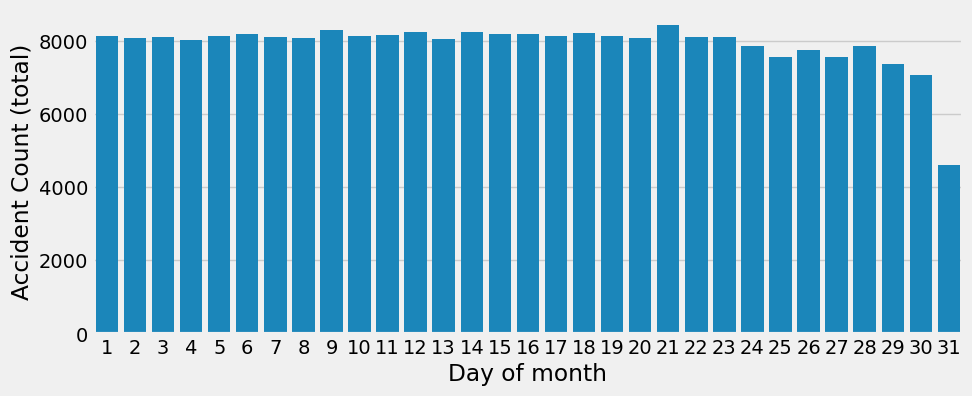

In [51]:
chart = plt.figure(figsize=(10,4))
sns.countplot(data=df, x=df['First_Occurrence_Date'].dt.day)
plt.xlabel('Day of month')
plt.ylabel('Accident Count (total)')

The answer is pretty obivious in that there are less days. The count is lower because there are less days to have the accidents and therefore the citation.

Now, what accounts for 22-28 dip?

That's a damn good question!

Text(0, 0.5, 'Accident Count')

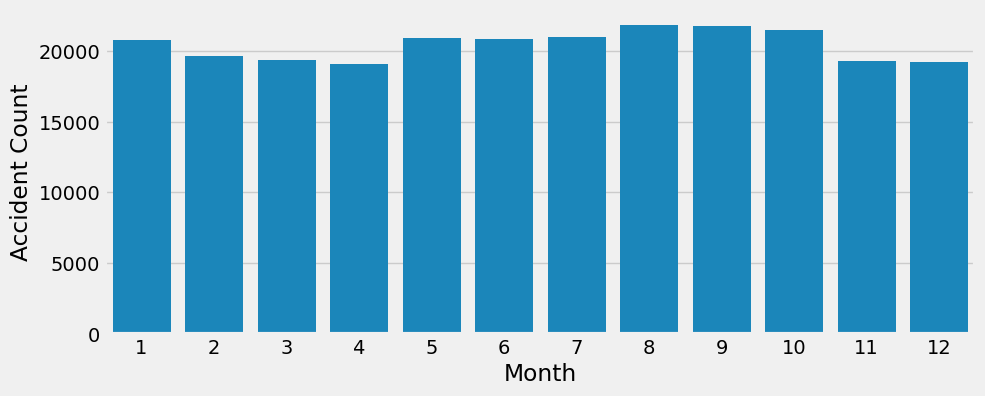

In [52]:
chart = plt.figure(figsize=(10,4))
sns.countplot(data=df, x=df['First_Occurrence_Date'].dt.month)
plt.xlabel('Month')
plt.ylabel('Accident Count')

## Ending 

Alright, that's it for now. Hopefully you found this fun and have a few questions of your own.

If not, here are few areas:

 - Accidents that involve pedestrians
 - Accidents that involve bike riders.
 - Look into the seasonality
 - Combine the distracted categories 